<a href="https://colab.research.google.com/github/mqquiroz/ICV513/blob/main/Anim_Group_Celerity.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

## Animación Celeridad de Grupo

El movimiento de la superficie libre está constituido por la superposición de 2 olas de misma amplitud pero de frecuencias distintas muy cercanas. Puede asumir que estas olas se propagan en aguas profundas. La primera tiene una frecuencia angular de 0.99045 rad/s y la segunda de 1.014914 rad/s.

Grafique la forma de la superficie libre y su dinámica (distintos instantes de tiempo).

In [58]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib import animation # libreria para animaciones
from IPython.display import HTML # libreria necesaria para mostrar las animaciones en google colab
import matplotlib as mp

#Constantes
g = 9.81

In [59]:
omega1 = 0.99045
omega2 = 1.014914

t_total = 120 #(s) tiempo total de animación

#aguas profundas
k1 = omega1**2.0/g
k2 = omega2**2.0/g

k          = (k1+k2)/2.0
omega      = (omega1+omega2)/2.0
deltak     = k2-k1
deltaomega = omega2-omega1

C  = omega/k
Cg = deltaomega/deltak

H = 1.0
dx = 1.0;
x = np.arange(0,3000+dx,dx)

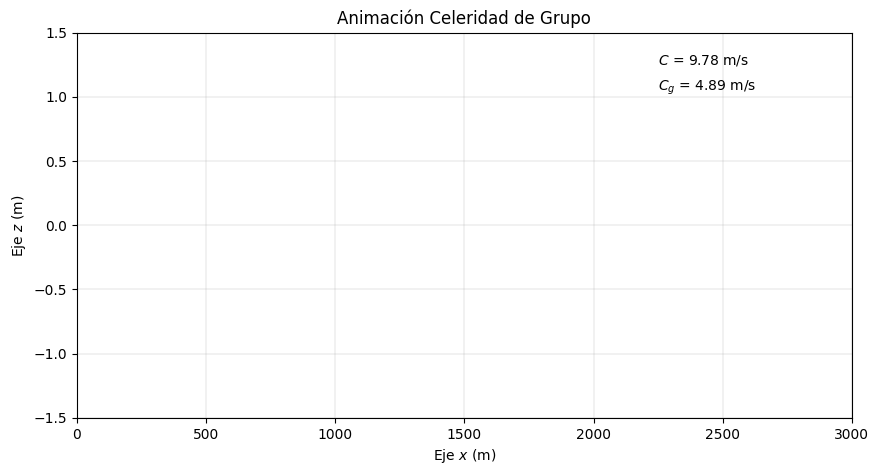

In [60]:
# Crearemos la figura a nuestra necesidad (antojo)
ancho = 10
alto  = 5

#Declaramos figura (fig) y eje (ax)
fig, ax = plt.subplots(figsize=(ancho,alto))

#Definir cosas que no se mueven (estáticas)
ax.set_xlabel('Eje $x$ (m)')
ax.set_ylabel('Eje $z$ (m)')
ax.set_title('Animación Celeridad de Grupo')
plt.text(2250.0,1.25*H,r'$C$ = '+str(np.round(C,2))+' m/s')
plt.text(2250.0,1.05*H,r'$C_{g}$ = '+str(np.round(Cg,2))+' m/s')
ax.set_xlim(x[0],x[-1])
ax.set_ylim(-1.5*H,1.5*H)
ax.grid(linewidth=0.25)
#ax.axhline(y=-h, color='k')

In [61]:
#Definimos las cosas animadas
line, = ax.plot([],[],linewidth=1.0,color='b')
line1, = ax.plot([],[],linewidth=1.0,color='k',linestyle='--')
line2, = ax.plot([],[],linewidth=1.0,color='k',linestyle='--')
time_text = ax.text(2250,-1.25*H,'',fontsize=12.5,verticalalignment='center')

def animate(t):
  eta      = H*np.cos(1.0/2.0*(deltak*x-deltaomega*t))*np.cos(k*x-omega*t)
  env_up   = np.cos(1.0/2.0*(deltak*x-deltaomega*t))
  env_down = -np.cos(1.0/2.0*(deltak*x-deltaomega*t))
  time_text.set_text('tiempo = %0.0f (s)' % (t,))
  line.set_data(x,eta)
  line1.set_data(x,env_up)
  line2.set_data(x,env_down)
  return line,line1,line2,time_text

anim = animation.FuncAnimation(fig,animate,frames=t_total+1,interval=100,blit=False)
anim.save('Anim_Celeridad_Grupo.mp4',dpi=300)

HTML(anim.to_jshtml())